<a href="https://colab.research.google.com/github/atikur234/BangladeshiCuisine/blob/main/Bangladeshi_Food_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
"""
Complete Food Object Detection Training Script for Google Colab
Includes all visualizations: Precision, Recall, mAP, Confusion Matrix, Training Curves
"""
#api key = "Jb64cqSt50RkIndr5jRu"

'\nComplete Food Object Detection Training Script for Google Colab\nIncludes all visualizations: Precision, Recall, mAP, Confusion Matrix, Training Curves\n'

In [ ]:
"""
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Jb64cqSt50RkIndr5jRu")
project = rf.workspace("dip-uorb3").project("bangladeshi-street-food-dataset-rjlri")
version = project.version(1)
dataset = version.download("yolov8")
"""


'\n!pip install roboflow\n\nfrom roboflow import Roboflow\nrf = Roboflow(api_key="Jb64cqSt50RkIndr5jRu")\nproject = rf.workspace("dip-uorb3").project("bangladeshi-street-food-dataset-rjlri")\nversion = project.version(1)\ndataset = version.download("yolov8")\n'

In [ ]:
# ============================================================================
# STEP 1: Install Required Packages
# ============================================================================
!pip install roboflow ultralytics pandas matplotlib seaborn scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.9 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-fft to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-random to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-umath to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.8/89.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 74.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━

In [ ]:
# ============================================================================
# STEP 2: Import Libraries
# ============================================================================
from roboflow import Roboflow
from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from pathlib import Path
import cv2
from IPython.display import Image, display
import os


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# ============================================================================
# STEP 3: Download Dataset from Roboflow
# ============================================================================
print("📥 Downloading dataset from Roboflow...")

# Initialize Roboflow (Get your API key from: https://app.roboflow.com/settings/api)
rf = Roboflow(api_key="Jb64cqSt50RkIndr5jRu")

# Replace with your workspace and project name
project = rf.workspace("dip-uorb3").project("bangladeshi-street-food-dataset-rjlri")

# Download dataset in YOLOv8 format
dataset = project.version(1).download("yolov8")

print(f"✅ Dataset downloaded to: {dataset.location}")

📥 Downloading dataset from Roboflow...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Bangladeshi-street-food-Dataset-1 in yolov8:: 100%|██████████| 30066/30066 [00:04<00:00, 6360.98it/s]


✅ Dataset downloaded to: /kaggle/working/Bangladeshi-street-food-Dataset-1


In [ ]:
# ============================================================================
# FIX: Downgrade NumPy for compatibility
# ============================================================================
!pip uninstall numpy -y
!pip install "numpy<2.0"

# Restart kernel if needed - you may need to re-run imports after this
print("NumPy downgraded successfully!")


Found existing installation: numpy 2.2.6
Uninstalling numpy-2.2.6:
  Successfully uninstalled numpy-2.2.6
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 82.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
gensim 4.3.3 requires scipy<1.14.0,>=1.7.0, but you have scipy 1.15.3 which is incompatible.
datasets 4.1.1 requires pyarrow>=21.0.0, but you have pyarrow 19.0.1 which is incompatible.
onnx 1.18.0 requires protobuf>=4.25.1, but you have protobuf 3.20.3 which is incompatible.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
google-colab 1.0.0 requires google-auth==2.38.0, but you have google-auth 2.40.3 which is incompati

In [ ]:
# ============================================================================
# STEP 4: Initialize and Train Model
# ============================================================================
print("\n🚀 Starting model training...")

# Load a pretrained YOLOv8 model
# Options: yolov8n.pt (nano), yolov8s.pt (small), yolov8m.pt (medium)
# yolov8l.pt (large), yolov8x.pt (extra large)
model = YOLO('yolov8m.pt')  # Using small for faster training

# Training configuration
results = model.train(
    data=f'{dataset.location}/data.yaml',  # Path to dataset config
    epochs=100,                             # Number of training epochs
    imgsz=640,                              # Image size
    batch=32,                               # Batch size (reduce if memory errors)
    patience=50,                            # Early stopping patience
    save=True,                              # Save checkpoints
    device= [0,1],                               # Use GPU 0 (T4)
    workers=8,                              # Number of workers for data loading
    project='food_detection',               # Project name
    name='train',                           # Experiment name
    exist_ok=True,                          # Overwrite existing project
    plots=True,                             # Generate plots
    val=True,                               # Validate during training

    # Augmentation settings
    hsv_h=0.015,                           # HSV-Hue augmentation
    hsv_s=0.7,                             # HSV-Saturation augmentation
    hsv_v=0.4,                             # HSV-Value augmentation
    degrees=0.0,                           # Rotation augmentation
    translate=0.1,                         # Translation augmentation
    scale=0.5,                             # Scale augmentation
    flipud=0.0,                            # Flip up-down augmentation
    fliplr=0.5,                            # Flip left-right augmentation
    mosaic=1.0,                            # Mosaic augmentation
    mixup=0.0,                             # Mixup augmentation
)

print("\n✅ Training completed!")


🚀 Starting model training...
Ultralytics 8.3.213 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/Bangladeshi-street-food-Dataset-1/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, 

In [ ]:
# ============================================================================
# STEP 5: Validate Model and Get Detailed Metrics
# ============================================================================
print("\n📊 Validating model and calculating metrics...")

# Load the best trained model
best_model = YOLO('food_detection/train/weights/best.pt')

# Validate with detailed metrics
metrics = best_model.val(
    data=f'{dataset.location}/data.yaml',
    plots=True,
    save_json=True,
    conf=0.25,
    iou=0.6
)


📊 Validating model and calculating metrics...
Ultralytics 8.3.213 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,853,656 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2149.7±744.9 MB/s, size: 87.3 KB)
val: Scanning /kaggle/working/Bangladeshi-street-food-Dataset-1/valid/labels.cache... 583 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 583/583 1.1Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 390, len(boxes) = 1077. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 37/37 2.2it/s 17.2s


invalid value encountered in less
invalid value encountered in less


                   all        583       1077      0.917      0.873      0.928      0.813
            bakorkhani         16         41      0.901      0.891      0.932      0.853
                beguni         38         70      0.949        0.7      0.842      0.756
               borhani         18         25      0.825      0.755      0.832      0.696
                   cha         26         45      0.902       0.82      0.885      0.746
             chanachur         23         25      0.957      0.898      0.948      0.841
              chotpoti         23         34       0.93      0.706      0.865      0.726
              dim cake         38         62      0.983      0.954      0.978      0.861
                 fuska         33         90      0.809      0.705      0.819       0.54
         grill chicken         13         15      0.919      0.867      0.915      0.721
             ilish_fry         14         32      0.866      0.906      0.963       0.82
              jhalmur

In [ ]:
# ============================================================================
# STEP 6: Display All Metrics
# ============================================================================
print("\n" + "="*70)
print("📈 MODEL PERFORMANCE METRICS")
print("="*70)

# Overall metrics
print(f"\n🎯 Overall Performance:")
print(f"   • mAP50-95 (Primary Metric): {metrics.box.map:.4f}")
print(f"   • mAP50: {metrics.box.map50:.4f}")
print(f"   • mAP75: {metrics.box.map75:.4f}")
print(f"   • Precision: {metrics.box.mp:.4f}")
print(f"   • Recall: {metrics.box.mr:.4f}")

# Per-class metrics
print(f"\n📋 Per-Class Performance:")
if hasattr(metrics.box, 'maps'):
    class_names = model.names  # Get class names
    for i, (class_name, ap) in enumerate(zip(class_names.values(), metrics.box.maps)):
        print(f"   • {class_name}: mAP50-95 = {ap:.4f}")

# Speed metrics
print(f"\n⚡ Inference Speed:")
print(f"   • Preprocess: {metrics.speed['preprocess']:.2f}ms")
print(f"   • Inference: {metrics.speed['inference']:.2f}ms")
print(f"   • Postprocess: {metrics.speed['postprocess']:.2f}ms")


📈 MODEL PERFORMANCE METRICS

🎯 Overall Performance:
   • mAP50-95 (Primary Metric): 0.8132
   • mAP50: 0.9278
   • mAP75: 0.8973
   • Precision: 0.9169
   • Recall: 0.8726

📋 Per-Class Performance:
   • bakorkhani: mAP50-95 = 0.8530
   • beguni: mAP50-95 = 0.7563
   • borhani: mAP50-95 = 0.6965
   • cha: mAP50-95 = 0.7458
   • chanachur: mAP50-95 = 0.8412
   • chotpoti: mAP50-95 = 0.7259
   • dim cake: mAP50-95 = 0.8605
   • fuska: mAP50-95 = 0.5401
   • grill chicken: mAP50-95 = 0.7211
   • ilish_fry: mAP50-95 = 0.8199
   • jhalmuri: mAP50-95 = 0.7437
   • jilapi: mAP50-95 = 0.9026
   • kacchi: mAP50-95 = 0.8154
   • kala bhuna: mAP50-95 = 0.8047
   • kulfi: mAP50-95 = 0.7624
   • murobba: mAP50-95 = 0.7962
   • naan: mAP50-95 = 0.8571
   • papar: mAP50-95 = 0.8389
   • patishapta: mAP50-95 = 0.8557
   • peyaju: mAP50-95 = 0.9167
   • puri: mAP50-95 = 0.9899
   • roshmalai: mAP50-95 = 0.8826
   • singara: mAP50-95 = 0.8839
   • tiler khaja: mAP50-95 = 0.9056

⚡ Inference Speed:
   • 


📊 Generating Confusion Matrix...
   ✅ Confusion matrix saved to: food_detection/train/confusion_matrix.csv


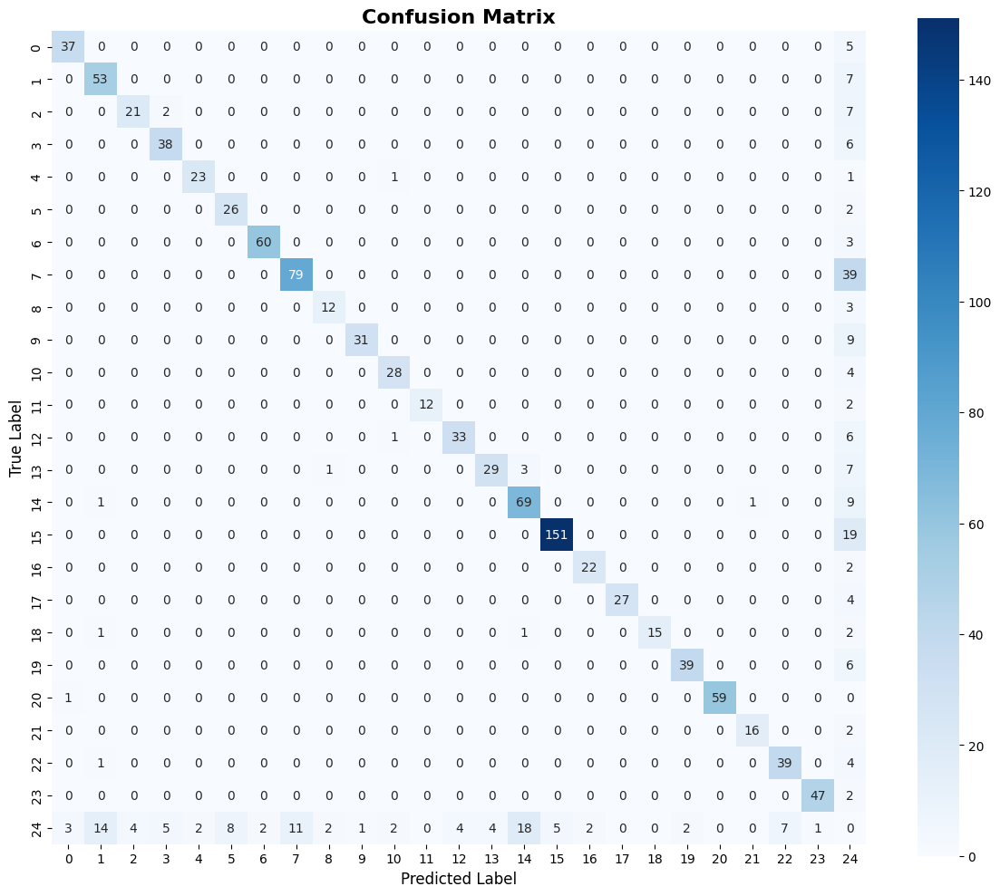

In [ ]:
# ============================================================================
# STEP 7: Export and Display Confusion Matrix
# ============================================================================
print("\n📊 Generating Confusion Matrix...")

# Get confusion matrix
cm = metrics.confusion_matrix
if cm is not None:
    # Export to different formats
    cm_df = cm.matrix  # Get the matrix as numpy array

    # Save as DataFrame
    cm_dataframe = pd.DataFrame(cm_df)
    cm_dataframe.to_csv('food_detection/train/confusion_matrix.csv', index=False)
    print(f"   ✅ Confusion matrix saved to: food_detection/train/confusion_matrix.csv")

    # Display confusion matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_df, annot=True, fmt='.0f', cmap='Blues', square=True)
    plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.tight_layout()
    plt.savefig('food_detection/train/confusion_matrix_detailed.png', dpi=300, bbox_inches='tight')
    plt.show()


📈 Displaying Training Curves...

📊 Results:


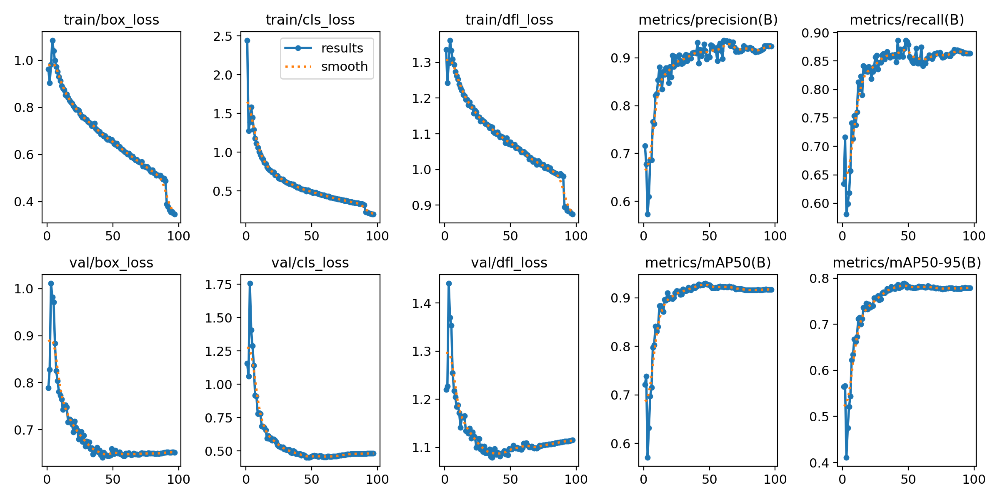


📊 Confusion Matrix:


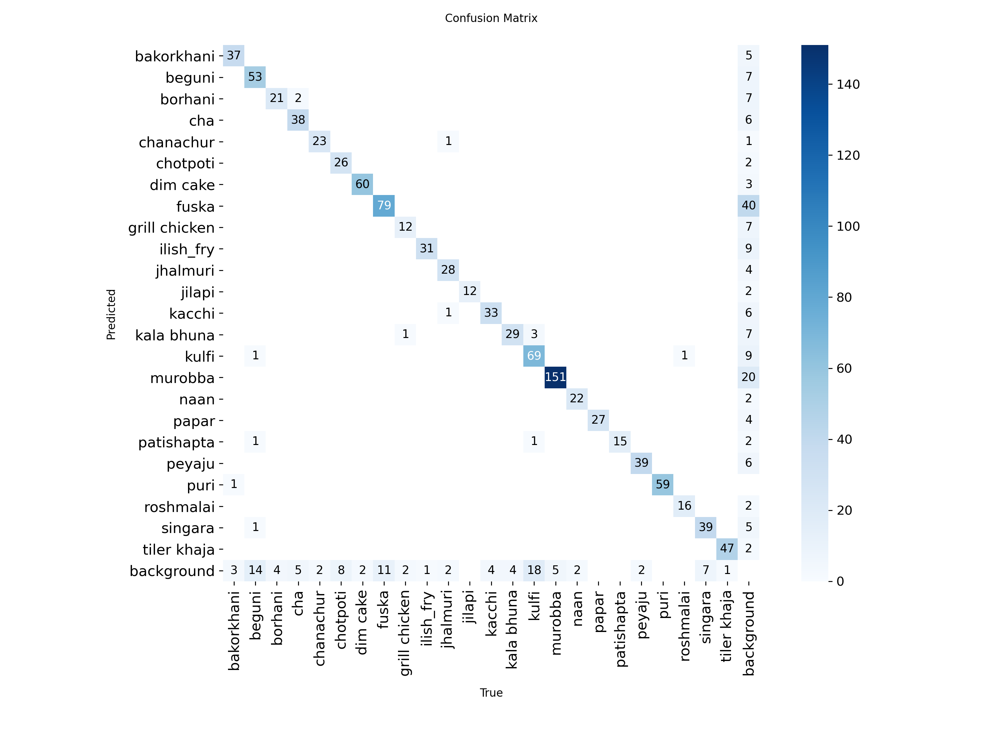

In [ ]:
# ============================================================================
# STEP 8: Display Training Curves
# ============================================================================
print("\n📈 Displaying Training Curves...")

# Path to results
results_path = Path('food_detection/train')

# Display generated plots
plot_files = [
    'results.png',           # Training results
    'confusion_matrix.png',  # Confusion matrix
    'P_curve.png',          # Precision curve
    'R_curve.png',          # Recall curve
    'PR_curve.png',         # Precision-Recall curve
    'F1_curve.png',         # F1 curve
]

for plot_file in plot_files:
    plot_path = results_path / plot_file
    if plot_path.exists():
        print(f"\n📊 {plot_file.replace('_', ' ').replace('.png', '').title()}:")
        display(Image(filename=str(plot_path)))


🎨 Creating custom metrics dashboard...


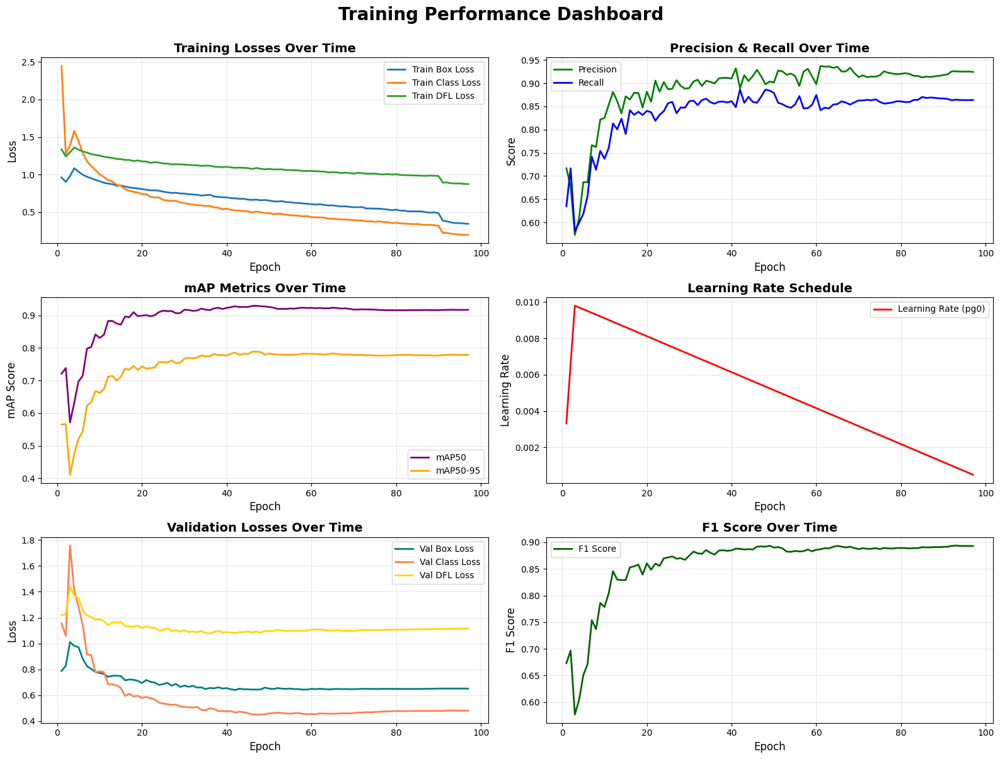


✅ Custom dashboard saved to: food_detection/train/training_dashboard.png


In [ ]:
# ============================================================================
# STEP 9: Create Custom Visualization Dashboard
# ============================================================================
print("\n🎨 Creating custom metrics dashboard...")

# Read training results
results_csv = pd.read_csv('food_detection/train/results.csv')
results_csv.columns = results_csv.columns.str.strip()  # Remove extra spaces

# Create comprehensive visualization
fig, axes = plt.subplots(3, 2, figsize=(16, 12))
fig.suptitle('Training Performance Dashboard', fontsize=20, fontweight='bold', y=1.00)

# Plot 1: Training and Validation Loss
ax1 = axes[0, 0]
if 'train/box_loss' in results_csv.columns:
    ax1.plot(results_csv['epoch'], results_csv['train/box_loss'], label='Train Box Loss', linewidth=2)
    ax1.plot(results_csv['epoch'], results_csv['train/cls_loss'], label='Train Class Loss', linewidth=2)
    ax1.plot(results_csv['epoch'], results_csv['train/dfl_loss'], label='Train DFL Loss', linewidth=2)
ax1.set_xlabel('Epoch', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.set_title('Training Losses Over Time', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Precision and Recall
ax2 = axes[0, 1]
if 'metrics/precision(B)' in results_csv.columns:
    ax2.plot(results_csv['epoch'], results_csv['metrics/precision(B)'], label='Precision', linewidth=2, color='green')
    ax2.plot(results_csv['epoch'], results_csv['metrics/recall(B)'], label='Recall', linewidth=2, color='blue')
ax2.set_xlabel('Epoch', fontsize=12)
ax2.set_ylabel('Score', fontsize=12)
ax2.set_title('Precision & Recall Over Time', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Plot 3: mAP Metrics
ax3 = axes[1, 0]
if 'metrics/mAP50(B)' in results_csv.columns:
    ax3.plot(results_csv['epoch'], results_csv['metrics/mAP50(B)'], label='mAP50', linewidth=2, color='purple')
    ax3.plot(results_csv['epoch'], results_csv['metrics/mAP50-95(B)'], label='mAP50-95', linewidth=2, color='orange')
ax3.set_xlabel('Epoch', fontsize=12)
ax3.set_ylabel('mAP Score', fontsize=12)
ax3.set_title('mAP Metrics Over Time', fontsize=14, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3)

# Plot 4: Learning Rate
ax4 = axes[1, 1]
if 'lr/pg0' in results_csv.columns:
    ax4.plot(results_csv['epoch'], results_csv['lr/pg0'], label='Learning Rate (pg0)', linewidth=2, color='red')
ax4.set_xlabel('Epoch', fontsize=12)
ax4.set_ylabel('Learning Rate', fontsize=12)
ax4.set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3)

# Plot 5: Validation Box Loss
ax5 = axes[2, 0]
if 'val/box_loss' in results_csv.columns:
    ax5.plot(results_csv['epoch'], results_csv['val/box_loss'], label='Val Box Loss', linewidth=2, color='teal')
    ax5.plot(results_csv['epoch'], results_csv['val/cls_loss'], label='Val Class Loss', linewidth=2, color='coral')
    ax5.plot(results_csv['epoch'], results_csv['val/dfl_loss'], label='Val DFL Loss', linewidth=2, color='gold')
ax5.set_xlabel('Epoch', fontsize=12)
ax5.set_ylabel('Loss', fontsize=12)
ax5.set_title('Validation Losses Over Time', fontsize=14, fontweight='bold')
ax5.legend()
ax5.grid(True, alpha=0.3)

# Plot 6: F1 Score (calculated)
ax6 = axes[2, 1]
if 'metrics/precision(B)' in results_csv.columns and 'metrics/recall(B)' in results_csv.columns:
    precision = results_csv['metrics/precision(B)']
    recall = results_csv['metrics/recall(B)']
    f1_score = 2 * (precision * recall) / (precision + recall + 1e-6)
    ax6.plot(results_csv['epoch'], f1_score, label='F1 Score', linewidth=2, color='darkgreen')
ax6.set_xlabel('Epoch', fontsize=12)
ax6.set_ylabel('F1 Score', fontsize=12)
ax6.set_title('F1 Score Over Time', fontsize=14, fontweight='bold')
ax6.legend()
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('food_detection/train/training_dashboard.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Custom dashboard saved to: food_detection/train/training_dashboard.png")

In [ ]:
# ============================================================================
# STEP 10: Export Metrics to CSV
# ============================================================================
print("\n💾 Exporting metrics to CSV...")

# Create summary metrics DataFrame
summary_metrics = {
    'Metric': ['mAP50-95', 'mAP50', 'mAP75', 'Precision', 'Recall', 'F1-Score'],
    'Value': [
        metrics.box.map,
        metrics.box.map50,
        metrics.box.map75,
        metrics.box.mp,
        metrics.box.mr,
        2 * (metrics.box.mp * metrics.box.mr) / (metrics.box.mp + metrics.box.mr + 1e-6)
    ]
}

summary_df = pd.DataFrame(summary_metrics)
summary_df.to_csv('food_detection/train/metrics_summary.csv', index=False)
print(f"   ✅ Metrics summary saved to: food_detection/train/metrics_summary.csv")

# Display summary table
print("\n" + "="*70)
print("📊 METRICS SUMMARY TABLE")
print("="*70)
print(summary_df.to_string(index=False))


💾 Exporting metrics to CSV...
   ✅ Metrics summary saved to: food_detection/train/metrics_summary.csv

📊 METRICS SUMMARY TABLE
   Metric    Value
 mAP50-95 0.813156
    mAP50 0.927782
    mAP75 0.897349
Precision 0.916920
   Recall 0.872600
 F1-Score 0.894211



🔍 Testing model on sample images...

image 1/583 /kaggle/working/Bangladeshi-street-food-Dataset-1/valid/images/000039_jpg.rf.eb4a5ad8f1a1475fb8a8e0a76560499f.jpg: 640x640 1 roshmalai, 37.1ms
image 2/583 /kaggle/working/Bangladeshi-street-food-Dataset-1/valid/images/000091_jpg.rf.69c320fbd4ee56f818c1ed35d08b7241.jpg: 640x640 1 kala bhuna, 37.1ms
image 3/583 /kaggle/working/Bangladeshi-street-food-Dataset-1/valid/images/000155_jpg.rf.42a33c5f23394524df1f8a39af696466.jpg: 640x640 1 kala bhuna, 33.8ms
image 4/583 /kaggle/working/Bangladeshi-street-food-Dataset-1/valid/images/000159_jpg.rf.49ad2084571c6bb52e4f621c685bf3a8.jpg: 640x640 1 kala bhuna, 24.2ms
image 5/583 /kaggle/working/Bangladeshi-street-food-Dataset-1/valid/images/000169_jpg.rf.3e8d4950950ad73a7b761ba50375cd1d.jpg: 640x640 1 kala bhuna, 24.2ms
image 6/583 /kaggle/working/Bangladeshi-street-food-Dataset-1/valid/images/000326_jpg.rf.38184940206920187608b38c8cffef63.jpg: 640x640 1 bakorkhani, 1 naan, 24.1ms
image 7/583 /kaggle

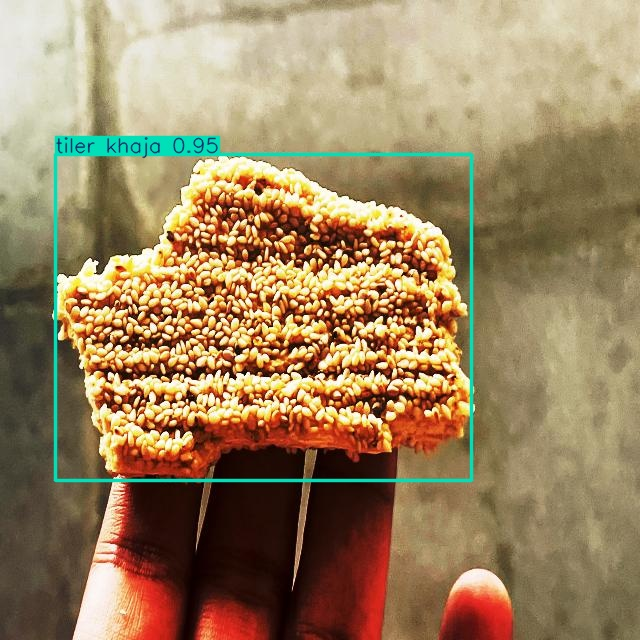

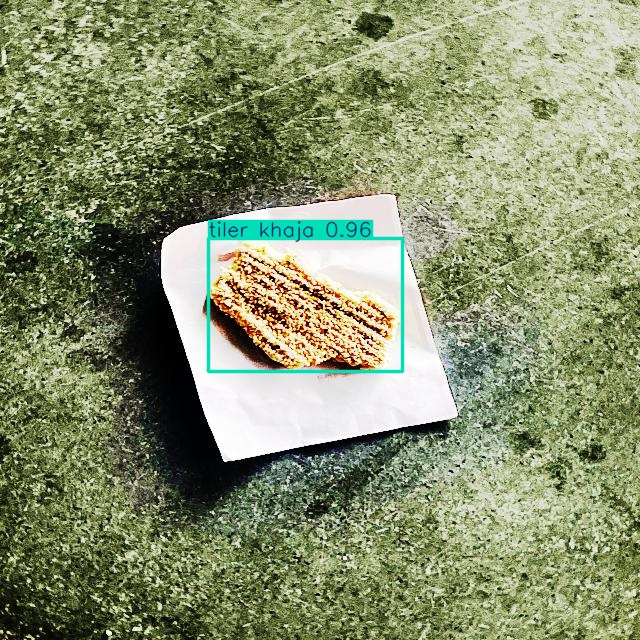

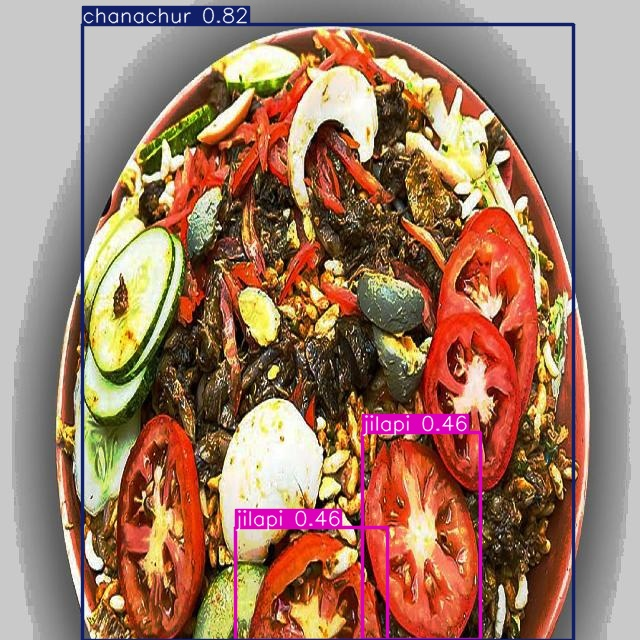

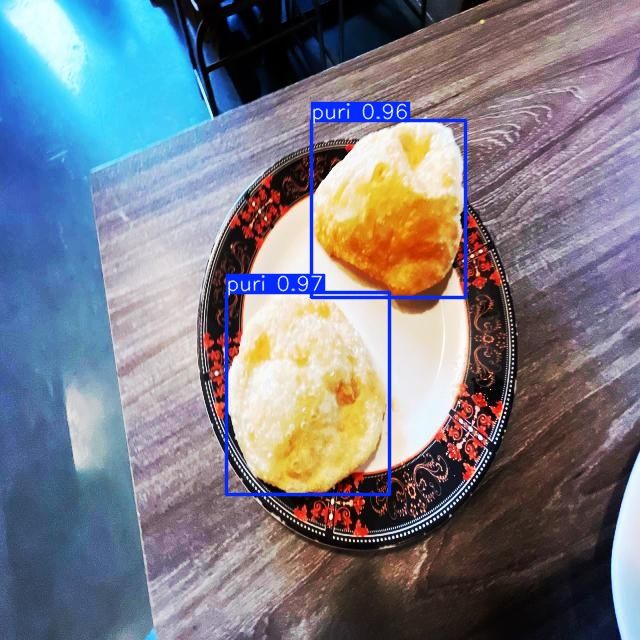

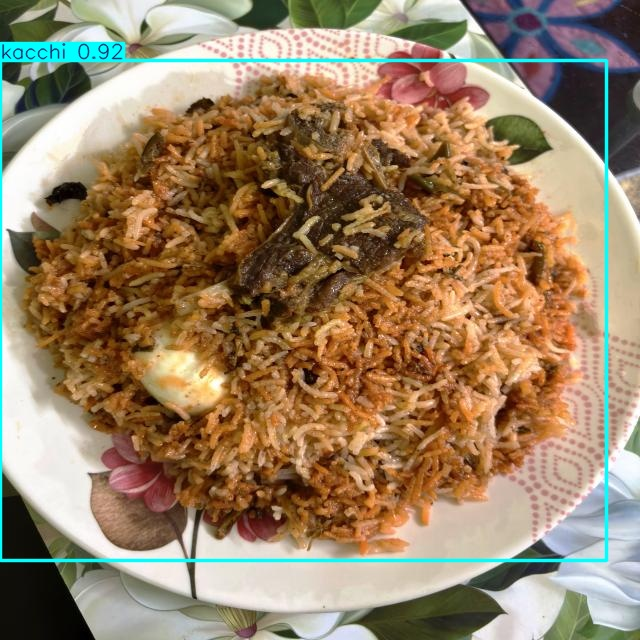

In [ ]:
# ============================================================================
# STEP 11: Test on Sample Images
# ============================================================================
print("\n🔍 Testing model on sample images...")

# Run prediction on validation images
val_results = best_model.predict(
    source=f'{dataset.location}/valid/images',
    save=True,
    conf=0.25,
    project='food_detection',
    name='predictions',
    exist_ok=True
)

print(f"   ✅ Predictions saved to: food_detection/predictions")

# Display some predictions
pred_dir = Path('food_detection/predictions')
pred_images = list(pred_dir.glob('*.jpg'))[:5]  # Show first 5 predictions

if pred_images:
    print("\n🖼️ Sample Predictions:")
    for img_path in pred_images:
        display(Image(filename=str(img_path), width=600))


In [ ]:
# ============================================================================
# STEP 12: Export Model
# ============================================================================
print("\n📦 Exporting trained model...")

# Export to different formats
best_model.export(format='onnx')  # Export to ONNX
print(f"   ✅ Model exported to ONNX format")


📦 Exporting trained model...
Ultralytics 8.3.213 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from 'food_detection/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 28, 8400) (49.7 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 4.2s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.18.0 opset 19...
ONNX: slimming with onnxslim 0.1.71...
ONNX: export success ✅ 7.6s, saved as 'food_detection/train/weights/best.onnx' (98.9 MB)

Export complete (9.0s)
Results saved to /kaggle/working/food_detection/train/weights
Predict:         yolo predict task=detect model=food_detection/train/weights/best.onnx i

In [ ]:
# ============================================================================
# STEP 13: Download Results
# ============================================================================
print("\n📥 To download your trained model and results:")
print("""
from google.colab import files

# Download best weights
files.download('food_detection/train/weights/best.pt')

# Download metrics
files.download('food_detection/train/metrics_summary.csv')

# Download training dashboard
files.download('food_detection/train/training_dashboard.png')
""")

print("\n" + "="*70)
print("✨ TRAINING COMPLETE! ✨")
print("="*70)
print("\n📁 All results saved in: food_detection/train/")
print("\n🎯 Key Files:")
print("   • Best Model: food_detection/train/weights/best.pt")
print("   • Last Model: food_detection/train/weights/last.pt")
print("   • Metrics: food_detection/train/metrics_summary.csv")
print("   • Dashboard: food_detection/train/training_dashboard.png")
print("   • Confusion Matrix: food_detection/train/confusion_matrix.png")
print("   • All Plots: food_detection/train/*.png")
print("="*70)


📥 To download your trained model and results:

from google.colab import files

# Download best weights
files.download('food_detection/train/weights/best.pt')

# Download metrics
files.download('food_detection/train/metrics_summary.csv')

# Download training dashboard
files.download('food_detection/train/training_dashboard.png')


✨ TRAINING COMPLETE! ✨

📁 All results saved in: food_detection/train/

🎯 Key Files:
   • Best Model: food_detection/train/weights/best.pt
   • Last Model: food_detection/train/weights/last.pt
   • Metrics: food_detection/train/metrics_summary.csv
   • Dashboard: food_detection/train/training_dashboard.png
   • Confusion Matrix: food_detection/train/confusion_matrix.png
   • All Plots: food_detection/train/*.png



📊 Generating Dataset Distribution for Paper...


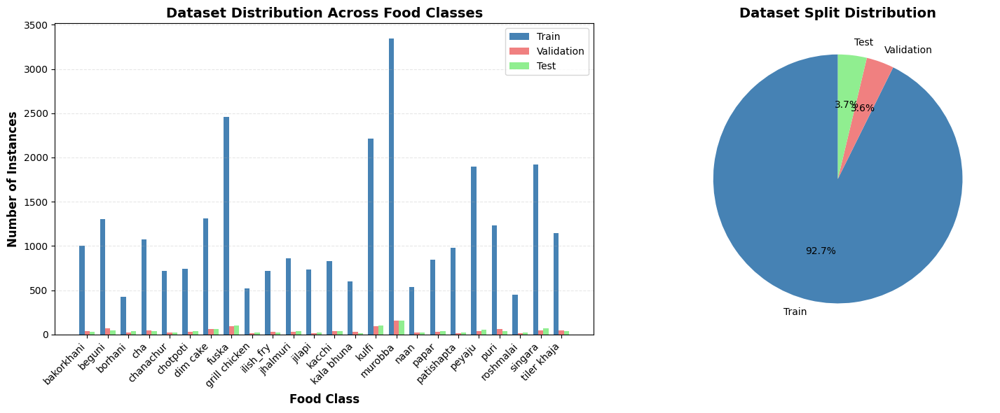

✅ Dataset distribution saved: food_detection/train/paper_dataset_distribution.png
✅ CSV saved: food_detection/train/dataset_distribution.csv

Dataset Summary:
        Class  Train  Validation  Test
   bakorkhani   1002          41    32
       beguni   1302          70    48
      borhani    426          25    37
          cha   1077          45    36
    chanachur    720          25    20
     chotpoti    744          34    38
     dim cake   1308          62    66
        fuska   2457          90   102
grill chicken    519          15    25
    ilish_fry    717          32    25
     jhalmuri    861          32    36
       jilapi    738          12    25
       kacchi    828          37    40
   kala bhuna    603          33    16
        kulfi   2211          91   105
      murobba   3348         156   157
         naan    537          24    25
        papar    846          27    39
   patishapta    981          15    26
       peyaju   1896          41    55
         puri   1233  

In [ ]:
# ==============================================================================
# NEW CELL 14: Dataset Distribution Visualization (For Paper)
# ==============================================================================
print("\n📊 Generating Dataset Distribution for Paper...")

import yaml

# Read class names from dataset
with open(f'{dataset.location}/data.yaml', 'r') as f:
    data_yaml = yaml.safe_load(f)

# Handle both list and dict formats
class_names = data_yaml['names']
if isinstance(class_names, dict):
    class_names_list = list(class_names.values())
else:
    class_names_list = class_names

# Count instances per class in each split
def count_class_instances(label_dir):
    class_counts = {name: 0 for name in class_names_list}
    label_path = Path(label_dir)

    for label_file in label_path.glob('*.txt'):
        with open(label_file, 'r') as f:
            for line in f:
                class_id = int(line.split()[0])
                class_counts[class_names_list[class_id]] += 1

    return class_counts

# Count for all splits
train_counts = count_class_instances(f'{dataset.location}/train/labels')
valid_counts = count_class_instances(f'{dataset.location}/valid/labels')
test_path = Path(f'{dataset.location}/test/labels')
test_counts = count_class_instances(f'{dataset.location}/test/labels') if test_path.exists() else {name: 0 for name in class_names_list}

# Create DataFrame
dataset_df = pd.DataFrame({
    'Class': list(train_counts.keys()),
    'Train': list(train_counts.values()),
    'Validation': list(valid_counts.values()),
    'Test': list(test_counts.values())
})

# Save to CSV
dataset_df.to_csv('food_detection/train/dataset_distribution.csv', index=False)

# Create visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
x = np.arange(len(dataset_df['Class']))
width = 0.25

bars1 = ax1.bar(x - width, dataset_df['Train'], width, label='Train', color='steelblue')
bars2 = ax1.bar(x, dataset_df['Validation'], width, label='Validation', color='lightcoral')
bars3 = ax1.bar(x + width, dataset_df['Test'], width, label='Test', color='lightgreen')

ax1.set_xlabel('Food Class', fontweight='bold', fontsize=12)
ax1.set_ylabel('Number of Instances', fontweight='bold', fontsize=12)
ax1.set_title('Dataset Distribution Across Food Classes', fontweight='bold', fontsize=14)
ax1.set_xticks(x)
ax1.set_xticklabels(dataset_df['Class'], rotation=45, ha='right')
ax1.legend()
ax1.grid(axis='y', alpha=0.3, linestyle='--')

# Pie chart showing split percentages
total_train = dataset_df['Train'].sum()
total_valid = dataset_df['Validation'].sum()
total_test = dataset_df['Test'].sum()

ax2.pie([total_train, total_valid, total_test],
        labels=['Train', 'Validation', 'Test'],
        autopct='%1.1f%%',
        colors=['steelblue', 'lightcoral', 'lightgreen'],
        startangle=90)
ax2.set_title('Dataset Split Distribution', fontweight='bold', fontsize=14)

plt.tight_layout()
plt.savefig('food_detection/train/paper_dataset_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Dataset distribution saved: food_detection/train/paper_dataset_distribution.png")
print("✅ CSV saved: food_detection/train/dataset_distribution.csv")
print(f"\nDataset Summary:\n{dataset_df.to_string(index=False)}")



🖼️ Creating Sample Images Grid for Paper...


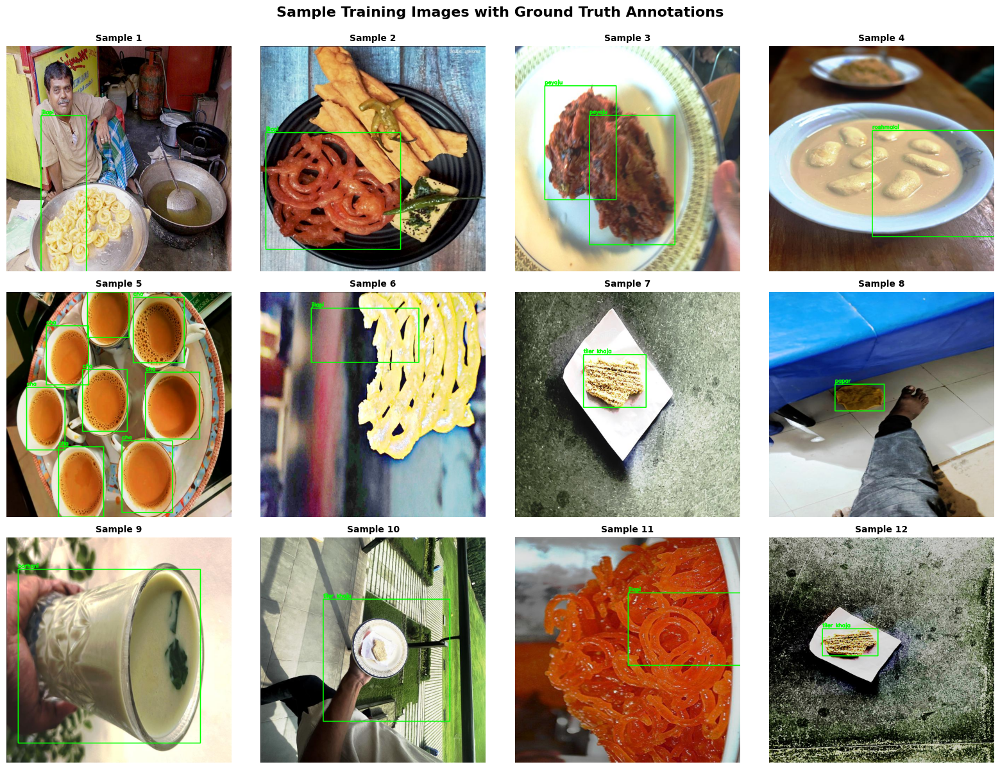

✅ Sample images grid saved: food_detection/train/paper_sample_images.png


In [ ]:
# ==============================================================================
# NEW CELL 15: Sample Images Grid with Annotations (For Paper)
# ==============================================================================
print("\n🖼️ Creating Sample Images Grid for Paper...")

# Get sample images
image_dir = Path(f'{dataset.location}/train/images')
label_dir = Path(f'{dataset.location}/train/labels')
image_files = list(image_dir.glob('*.jpg'))[:12]  # Get 12 samples

# Create 3x4 grid
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.flatten()

for idx, img_path in enumerate(image_files):
    # Load image
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load corresponding labels
    label_path = label_dir / (img_path.stem + '.txt')
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:5])

                # Convert to pixel coordinates
                h, w = img.shape[:2]
                x1 = int((x_center - width/2) * w)
                y1 = int((y_center - height/2) * h)
                x2 = int((x_center + width/2) * w)
                y2 = int((y_center + height/2) * h)

                # Draw bounding box
                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(img, class_names[class_id], (x1, y1-5),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f'Sample {idx+1}', fontsize=10, fontweight='bold')

plt.suptitle('Sample Training Images with Ground Truth Annotations',
             fontweight='bold', fontsize=16, y=0.995)
plt.tight_layout()
plt.savefig('food_detection/train/paper_sample_images.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Sample images grid saved: food_detection/train/paper_sample_images.png")



📋 Creating Model Comparison Table for Paper...


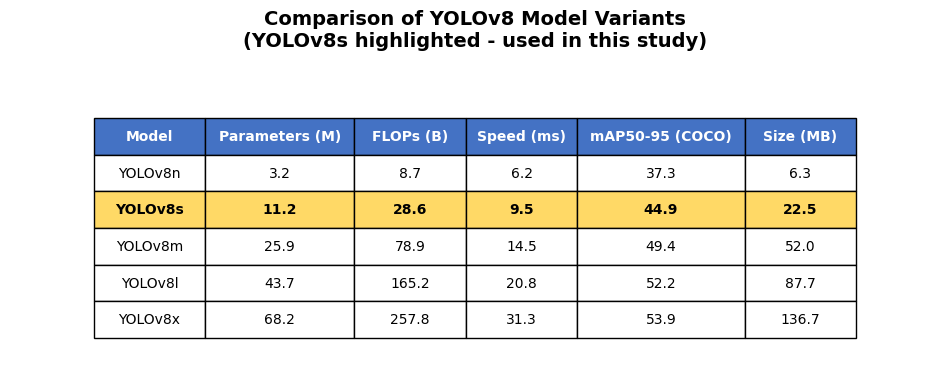

✅ Model comparison table saved: food_detection/train/paper_model_comparison.png
✅ CSV saved: food_detection/train/model_comparison.csv

  Model  Parameters (M)  FLOPs (B)  Speed (ms)  mAP50-95 (COCO)  Size (MB)
YOLOv8n             3.2        8.7         6.2             37.3        6.3
YOLOv8s            11.2       28.6         9.5             44.9       22.5
YOLOv8m            25.9       78.9        14.5             49.4       52.0
YOLOv8l            43.7      165.2        20.8             52.2       87.7
YOLOv8x            68.2      257.8        31.3             53.9      136.7


In [ ]:
# ==============================================================================
# NEW CELL 16: Model Comparison Table (For Paper)
# ==============================================================================
print("\n📋 Creating Model Comparison Table for Paper...")

# Create comparison data for YOLOv8 variants
model_comparison = {
    'Model': ['YOLOv8n', 'YOLOv8s', 'YOLOv8m', 'YOLOv8l', 'YOLOv8x'],
    'Parameters (M)': [3.2, 11.2, 25.9, 43.7, 68.2],
    'FLOPs (B)': [8.7, 28.6, 78.9, 165.2, 257.8],
    'Speed (ms)': [6.2, 9.5, 14.5, 20.8, 31.3],
    'mAP50-95 (COCO)': [37.3, 44.9, 49.4, 52.2, 53.9],
    'Size (MB)': [6.3, 22.5, 52.0, 87.7, 136.7]
}

model_df = pd.DataFrame(model_comparison)
model_df.to_csv('food_detection/train/model_comparison.csv', index=False)

# Create table visualization
fig, ax = plt.subplots(figsize=(12, 4))
ax.axis('tight')
ax.axis('off')

table = ax.table(cellText=model_df.values,
                colLabels=model_df.columns,
                cellLoc='center',
                loc='center',
                colWidths=[0.12, 0.16, 0.12, 0.12, 0.18, 0.12])

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2.2)

# Style header row
for i in range(len(model_df.columns)):
    table[(0, i)].set_facecolor('#4472C4')
    table[(0, i)].set_text_props(weight='bold', color='white')

# Highlight YOLOv8s (row 2, index 1)
for j in range(len(model_df.columns)):
    table[(2, j)].set_facecolor('#FFD966')
    table[(2, j)].set_text_props(weight='bold')

plt.title('Comparison of YOLOv8 Model Variants\n(YOLOv8s highlighted - used in this study)',
          fontweight='bold', fontsize=14, pad=20)
plt.savefig('food_detection/train/paper_model_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Model comparison table saved: food_detection/train/paper_model_comparison.png")
print("✅ CSV saved: food_detection/train/model_comparison.csv")
print(f"\n{model_df.to_string(index=False)}")



📊 Creating Per-Class Performance Analysis for Paper...


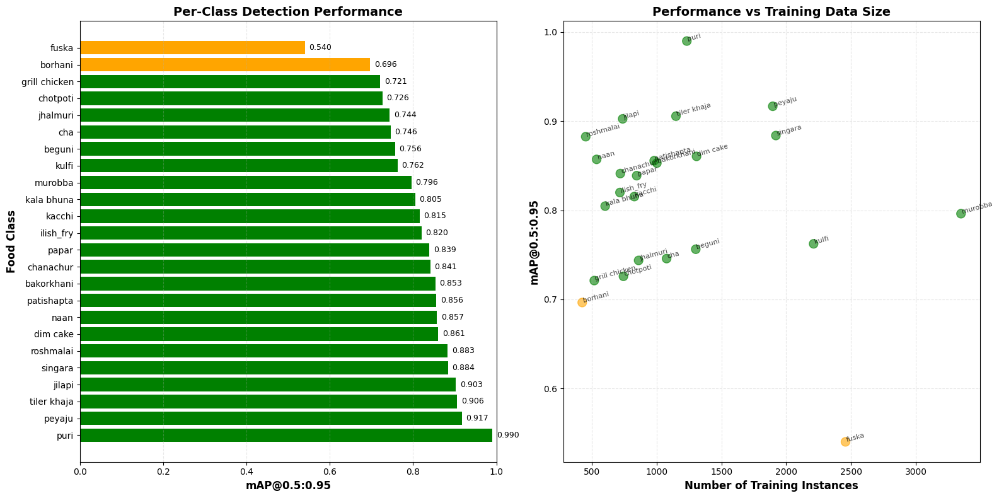

✅ Per-class performance saved: food_detection/train/paper_per_class_performance.png
✅ CSV saved: food_detection/train/per_class_performance.csv

        Class  mAP50-95  Instances_Train  Instances_Val
         puri  0.989923             1233             59
       peyaju  0.916726             1896             41
  tiler khaja  0.905620             1149             48
       jilapi  0.902608              738             12
      singara  0.883894             1920             46
    roshmalai  0.882612              453             17
     dim cake  0.860521             1308             62
         naan  0.857137              537             24
   patishapta  0.855657              981             15
   bakorkhani  0.852974             1002             41
    chanachur  0.841220              720             25
        papar  0.838854              846             27
    ilish_fry  0.819948              717             32
       kacchi  0.815382              828             37
   kala bhuna  

In [ ]:
# ==============================================================================
# NEW CELL 17: Per-Class Performance Analysis (For Paper)
# ==============================================================================
print("\n📊 Creating Per-Class Performance Analysis for Paper...")

# Get per-class metrics
if hasattr(metrics.box, 'maps'):
    per_class_map = metrics.box.maps

    # Create DataFrame
    per_class_df = pd.DataFrame({
        'Class': class_names_list,  # Use class_names_list instead
        'mAP50-95': per_class_map,
        'Instances_Train': [train_counts[c] for c in class_names_list],
        'Instances_Val': [valid_counts[c] for c in class_names_list]
    })

    # Sort by mAP
    per_class_df = per_class_df.sort_values('mAP50-95', ascending=False)
    per_class_df.to_csv('food_detection/train/per_class_performance.csv', index=False)

    # Create visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    # Plot 1: Per-class mAP
    colors = ['green' if x >= 0.7 else 'orange' if x >= 0.5 else 'red'
              for x in per_class_df['mAP50-95']]
    bars = ax1.barh(per_class_df['Class'], per_class_df['mAP50-95'], color=colors)
    ax1.set_xlabel('mAP@0.5:0.95', fontweight='bold', fontsize=12)
    ax1.set_ylabel('Food Class', fontweight='bold', fontsize=12)
    ax1.set_title('Per-Class Detection Performance', fontweight='bold', fontsize=14)
    ax1.grid(axis='x', alpha=0.3, linestyle='--')
    ax1.set_xlim([0, 1])

    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, per_class_df['mAP50-95'])):
        ax1.text(val + 0.01, bar.get_y() + bar.get_height()/2,
                f'{val:.3f}', va='center', fontsize=9)

    # Plot 2: Class distribution vs performance
    ax2.scatter(per_class_df['Instances_Train'], per_class_df['mAP50-95'],
               s=100, alpha=0.6, c=colors)

    # Add labels for each point
    for idx, row in per_class_df.iterrows():
        ax2.annotate(row['Class'],
                    (row['Instances_Train'], row['mAP50-95']),
                    fontsize=8, alpha=0.7, rotation=15)

    ax2.set_xlabel('Number of Training Instances', fontweight='bold', fontsize=12)
    ax2.set_ylabel('mAP@0.5:0.95', fontweight='bold', fontsize=12)
    ax2.set_title('Performance vs Training Data Size', fontweight='bold', fontsize=14)
    ax2.grid(True, alpha=0.3, linestyle='--')

    plt.tight_layout()
    plt.savefig('food_detection/train/paper_per_class_performance.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("✅ Per-class performance saved: food_detection/train/paper_per_class_performance.png")
    print("✅ CSV saved: food_detection/train/per_class_performance.csv")
    print(f"\n{per_class_df.to_string(index=False)}")



⚡ Creating Inference Speed Analysis for Paper...


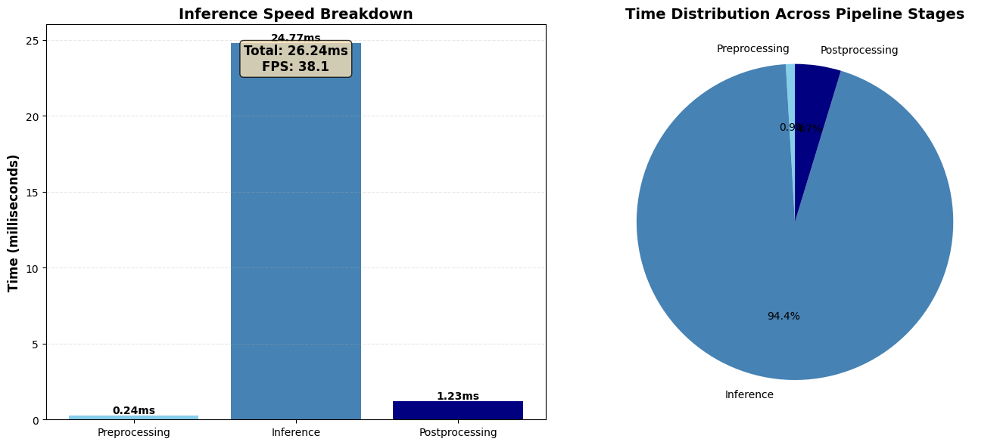

✅ Inference speed analysis saved: food_detection/train/paper_inference_speed.png
✅ CSV saved: food_detection/train/inference_speed.csv

Inference Speed Summary:
  Total Time: 26.24ms
  FPS: 38.1

 Process Stage  Time (ms)
 Preprocessing   0.243455
     Inference  24.765865
Postprocessing   1.231633


In [ ]:
# ==============================================================================
# NEW CELL 18: Inference Speed Analysis (For Paper)
# ==============================================================================
print("\n⚡ Creating Inference Speed Analysis for Paper...")

# Create speed analysis
speed_data = {
    'Process Stage': ['Preprocessing', 'Inference', 'Postprocessing'],
    'Time (ms)': [
        metrics.speed['preprocess'],
        metrics.speed['inference'],
        metrics.speed['postprocess']
    ]
}

speed_df = pd.DataFrame(speed_data)
speed_df.to_csv('food_detection/train/inference_speed.csv', index=False)

# Calculate total time and FPS
total_time = speed_df['Time (ms)'].sum()
fps = 1000 / total_time

# Create visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Bar chart
colors_speed = ['skyblue', 'steelblue', 'navy']
bars = ax1.bar(speed_df['Process Stage'], speed_df['Time (ms)'], color=colors_speed)
ax1.set_ylabel('Time (milliseconds)', fontweight='bold', fontsize=12)
ax1.set_title('Inference Speed Breakdown', fontweight='bold', fontsize=14)
ax1.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:.2f}ms', ha='center', va='bottom', fontweight='bold')

# Add total and FPS annotation
ax1.text(0.5, 0.95, f'Total: {total_time:.2f}ms\nFPS: {fps:.1f}',
        transform=ax1.transAxes, ha='center', va='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
        fontsize=12, fontweight='bold')

# Pie chart
ax2.pie(speed_df['Time (ms)'], labels=speed_df['Process Stage'],
       autopct='%1.1f%%', colors=colors_speed, startangle=90)
ax2.set_title('Time Distribution Across Pipeline Stages', fontweight='bold', fontsize=14)

plt.tight_layout()
plt.savefig('food_detection/train/paper_inference_speed.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Inference speed analysis saved: food_detection/train/paper_inference_speed.png")
print("✅ CSV saved: food_detection/train/inference_speed.csv")
print(f"\nInference Speed Summary:")
print(f"  Total Time: {total_time:.2f}ms")
print(f"  FPS: {fps:.1f}")
print(f"\n{speed_df.to_string(index=False)}")





📋 Creating Final Metrics Summary Table for Paper...


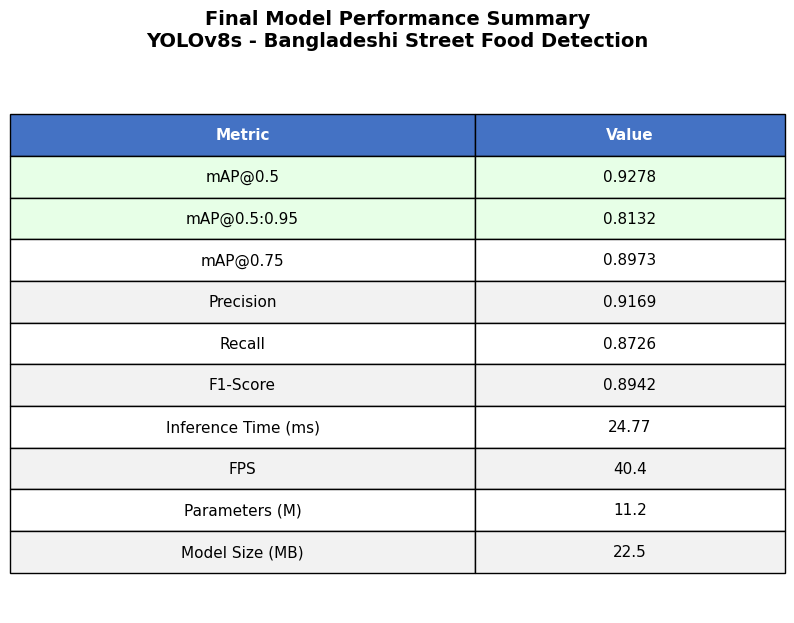

✅ Final metrics table saved: food_detection/train/paper_final_metrics_table.png
✅ CSV saved: food_detection/train/final_metrics_summary.csv

             Metric  Value
            mAP@0.5 0.9278
       mAP@0.5:0.95 0.8132
           mAP@0.75 0.8973
          Precision 0.9169
             Recall 0.8726
           F1-Score 0.8942
Inference Time (ms)  24.77
                FPS   40.4
     Parameters (M)   11.2
    Model Size (MB)   22.5


In [ ]:
# ==============================================================================
# NEW CELL 19: Final Metrics Summary Table (For Paper)
# ==============================================================================
print("\n📋 Creating Final Metrics Summary Table for Paper...")

# Calculate F1-score
precision = metrics.box.mp
recall = metrics.box.mr
f1 = 2 * (precision * recall) / (precision + recall + 1e-6)

# Create comprehensive metrics table
final_metrics = {
    'Metric': [
        'mAP@0.5',
        'mAP@0.5:0.95',
        'mAP@0.75',
        'Precision',
        'Recall',
        'F1-Score',
        'Inference Time (ms)',
        'FPS',
        'Parameters (M)',
        'Model Size (MB)'
    ],
    'Value': [
        f'{metrics.box.map50:.4f}',
        f'{metrics.box.map:.4f}',
        f'{metrics.box.map75:.4f}',
        f'{precision:.4f}',
        f'{recall:.4f}',
        f'{f1:.4f}',
        f'{metrics.speed["inference"]:.2f}',
        f'{1000/metrics.speed["inference"]:.1f}',
        '11.2',
        '22.5'
    ]
}

final_df = pd.DataFrame(final_metrics)
final_df.to_csv('food_detection/train/final_metrics_summary.csv', index=False)

# Create table visualization
fig, ax = plt.subplots(figsize=(10, 7))
ax.axis('tight')
ax.axis('off')

table = ax.table(cellText=final_df.values,
                colLabels=final_df.columns,
                cellLoc='center',
                loc='center',
                colWidths=[0.6, 0.4])

table.auto_set_font_size(False)
table.set_fontsize(11)
table.scale(1, 2.5)

# Style header
for i in range(len(final_df.columns)):
    table[(0, i)].set_facecolor('#4472C4')
    table[(0, i)].set_text_props(weight='bold', color='white')

# Alternate row colors
for i in range(1, len(final_df) + 1):
    for j in range(len(final_df.columns)):
        if i % 2 == 0:
            table[(i, j)].set_facecolor('#F2F2F2')
        # Highlight key metrics
        if i in [1, 2]:  # mAP metrics
            table[(i, j)].set_facecolor('#E7FFE7')

plt.title('Final Model Performance Summary\nYOLOv8s - Bangladeshi Street Food Detection',
          fontweight='bold', fontsize=14, pad=20)
plt.savefig('food_detection/train/paper_final_metrics_table.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Final metrics table saved: food_detection/train/paper_final_metrics_table.png")
print("✅ CSV saved: food_detection/train/final_metrics_summary.csv")
print(f"\n{final_df.to_string(index=False)}")




🔍 Creating Sample Predictions Visualization for Paper...


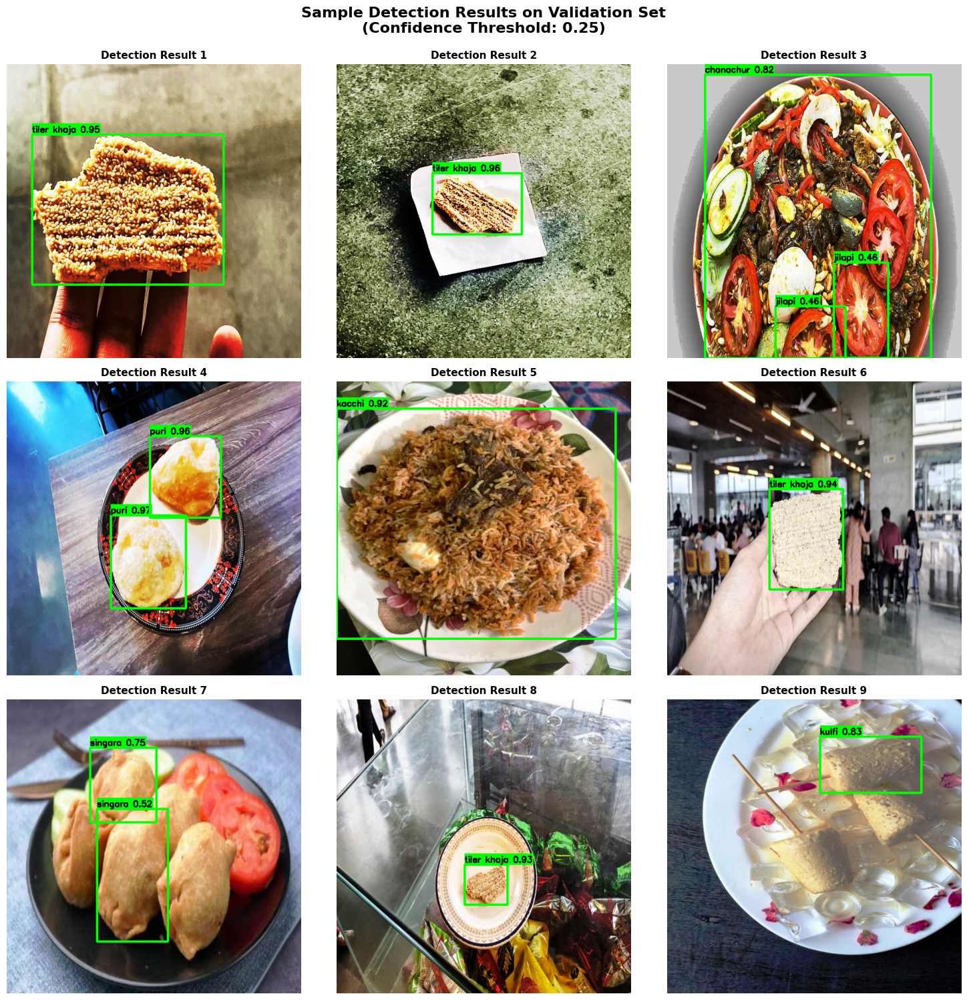

✅ Sample predictions saved: food_detection/train/paper_sample_predictions.png


In [ ]:
# ==============================================================================
# NEW CELL 20: Sample Predictions Visualization (For Paper)
# ==============================================================================
print("\n🔍 Creating Sample Predictions Visualization for Paper...")

# Get sample prediction results
val_images = list(Path(f'{dataset.location}/valid/images').glob('*.jpg'))[:9]

# Run predictions
sample_results = best_model.predict(
    source=val_images,
    save=False,
    conf=0.25,
    verbose=False
)

# Create 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for idx, (result, ax) in enumerate(zip(sample_results, axes)):
    # Get image
    img = result.orig_img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Draw predictions
    if len(result.boxes) > 0:
        for box in result.boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            label = f'{model.names[cls]} {conf:.2f}'

            # Draw box and label
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)

            # Add background for text
            (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
            cv2.rectangle(img, (x1, y1-text_height-10), (x1+text_width, y1), (0, 255, 0), -1)
            cv2.putText(img, label, (x1, y1-5),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 2)

    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f'Detection Result {idx+1}', fontsize=11, fontweight='bold')

plt.suptitle('Sample Detection Results on Validation Set\n(Confidence Threshold: 0.25)',
             fontweight='bold', fontsize=16, y=0.995)
plt.tight_layout()
plt.savefig('food_detection/train/paper_sample_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Sample predictions saved: food_detection/train/paper_sample_predictions.png")



In [ ]:
# ==============================================================================
# NEW CELL 21: Paper-Ready Files Summary
# ==============================================================================
print("\n" + "="*80)
print("📄 PAPER-READY VISUALIZATIONS SUMMARY")
print("="*80)

print("\n✅ All paper visualizations have been generated!")
print("\n📊 Generated Visualizations:")

paper_files = {
    1: "paper_dataset_distribution.png - Dataset class distribution (bar + pie chart)",
    2: "paper_sample_images.png - Sample training images with annotations",
    3: "paper_model_comparison.png - YOLOv8 model variants comparison table",
    4: "paper_per_class_performance.png - Per-class mAP and data correlation",
    5: "paper_inference_speed.png - Inference speed breakdown analysis",
    6: "paper_final_metrics_table.png - Comprehensive metrics summary table",
    7: "paper_sample_predictions.png - Detection results on validation images",
    8: "training_dashboard.png - Complete training curves (6 subplots)",
    9: "confusion_matrix.png - Confusion matrix from YOLO",
    10: "results.png - Default YOLO training results",
    11: "PR_curve.png - Precision-Recall curve",
    12: "F1_curve.png - F1-score curve",
    13: "P_curve.png - Precision curve",
    14: "R_curve.png - Recall curve"
}

for num, desc in paper_files.items():
    print(f"  {num:2d}. {desc}")

print("\n📁 All files location: food_detection/train/")

print("\n📝 CSV Data Files:")
csv_files = [
    "dataset_distribution.csv - Class distribution data",
    "model_comparison.csv - Model variants comparison data",
    "per_class_performance.csv - Per-class metrics data",
    "inference_speed.csv - Speed breakdown data",
    "final_metrics_summary.csv - Final metrics table data",
    "confusion_matrix.csv - Confusion matrix values",
    "metrics_summary.csv - Overall metrics summary",
    "results.csv - Complete training log"
]

for csv in csv_files:
    print(f"  • {csv}")

print("\n🎯 Recommended Figures for Paper:")
print("  • Figure 1: Dataset Distribution (paper_dataset_distribution.png)")
print("  • Figure 2: Sample Images (paper_sample_images.png)")
print("  • Figure 3: Model Architecture (paper_model_comparison.png)")
print("  • Figure 4: Training Curves (training_dashboard.png)")
print("  • Figure 5: Confusion Matrix (confusion_matrix.png)")
print("  • Figure 6: Per-Class Performance (paper_per_class_performance.png)")
print("  • Figure 7: PR Curve (PR_curve.png)")
print("  • Figure 8: Inference Speed (paper_inference_speed.png)")
print("  • Figure 9: Sample Predictions (paper_sample_predictions.png)")
print("  • Table 1: Model Comparison (paper_model_comparison.png)")
print("  • Table 2: Final Metrics (paper_final_metrics_table.png)")

print("\n" + "="*80)
print("🎉 ALL PAPER VISUALIZATIONS READY!")
print("="*80)


📄 PAPER-READY VISUALIZATIONS SUMMARY

✅ All paper visualizations have been generated!

📊 Generated Visualizations:
   1. paper_dataset_distribution.png - Dataset class distribution (bar + pie chart)
   2. paper_sample_images.png - Sample training images with annotations
   3. paper_model_comparison.png - YOLOv8 model variants comparison table
   4. paper_per_class_performance.png - Per-class mAP and data correlation
   5. paper_inference_speed.png - Inference speed breakdown analysis
   6. paper_final_metrics_table.png - Comprehensive metrics summary table
   7. paper_sample_predictions.png - Detection results on validation images
   8. training_dashboard.png - Complete training curves (6 subplots)
   9. confusion_matrix.png - Confusion matrix from YOLO
  10. results.png - Default YOLO training results
  11. PR_curve.png - Precision-Recall curve
  12. F1_curve.png - F1-score curve
  13. P_curve.png - Precision curve
  14. R_curve.png - Recall curve

📁 All files location: food_detectio